In [1]:
import squidpy as sq
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import warnings

warnings.filterwarnings("ignore")

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

# Example notebook demonstrating how to use the `sq.gr.calculate_niche()` method

## Let's first get get some data

load example data with cell type annotation:

In [4]:
adata = sq.datasets.merfish()

# the dataset contains multiple slides, we only use one for now
adata = adata[adata.obs.Bregma == -9]

# we'll use this later for plotting
sc.pp.neighbors(adata)
sc.tl.umap(adata)

adata
# the `Cell_class` column is the cell type annotation

AnnData object with n_obs × n_vars = 6185 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch'
    uns: 'Cell_class_colors', 'pca', 'neighbors', 'umap'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

Every niche method requires a spatial neighborhood graph, which is why `sq.gr.spatial_neighbors` needs to be run first.

In [5]:
sq.gr.spatial_neighbors(adata, coord_type="generic", delaunay=False, n_neighs=20)

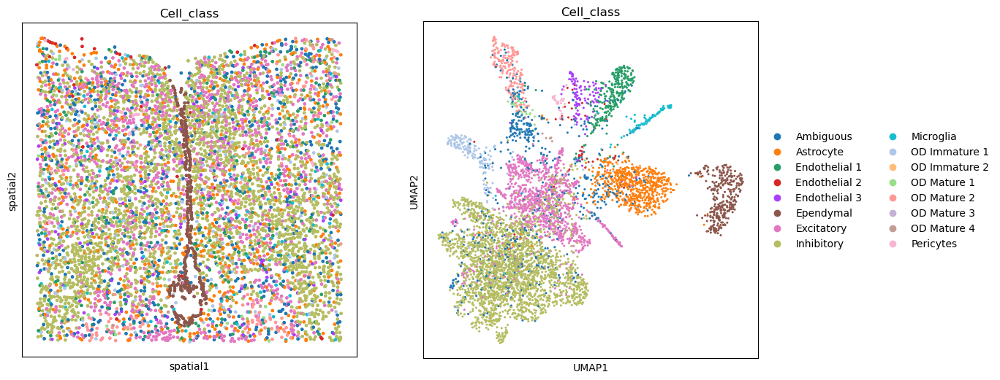

<Figure size 640x480 with 0 Axes>

In [6]:
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(13, 6))

sq.pl.spatial_scatter(adata, color="Cell_class", shape=None, legend_loc=None, ax=axs[0])

sc.pl.umap(adata, color="Cell_class", ax=axs[1])

plt.tight_layout()

## Neighborhood approach
adapted from https://github.com/immunitastx/monkeybread/

In [7]:
sq.gr.calculate_niche(
    adata,
    groups="Cell_class",
    flavor="neighborhood",
    n_neighbors=10,
    resolutions=[0.5, 1.0],
)
adata

AnnData object with n_obs × n_vars = 6185 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'nhood_niche_res=0.5', 'nhood_niche_res=1.0'
    uns: 'Cell_class_colors', 'pca', 'neighbors', 'umap', 'spatial_neighbors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'

The niche result is now stored in `adata.obs`. One column per resolution is created, indicating the niche assignment.

In [8]:
adata.obs

,Cell_ID,Animal_ID,Animal_sex,Behavior,Bregma,Centroid_X,Centroid_Y,Cell_class,Neuron_cluster_ID,batch,nhood_niche_res=0.5,nhood_niche_res=1.0
41437-4,8c7df84c-8a53-4aa4-86fd-26e575de9b0e,1,Female,Naive,-9.0,1313.511887,2162.459959,Microglia,nan,4,2,34
41438-4,3617ee7c-c0a8-4f18-b9bd-c7ca737ff665,1,Female,Naive,-9.0,1321.787911,2288.708578,Astrocyte,nan,4,2,1
41439-4,f0d0277a-cac1-4181-8528-abfd9a5403c0,1,Female,Naive,-9.0,1333.694106,2116.464893,Astrocyte,nan,4,2,34
41440-4,2dbbce4f-c54f-4df8-aced-590c971db48a,1,Female,Naive,-9.0,1339.956433,2200.067589,Astrocyte,nan,4,2,1
41441-4,74d3f69d-e8f2-4c33-a8ca-fac3eb65e55a,1,Female,Naive,-9.0,1340.563484,2251.463695,Endothelial 1,nan,4,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
47617-4,7a0e3ee6-aa12-4ed8-80ae-465e186caa3f,1,Female,Naive,-9.0,3060.524623,3700.928535,Inhibitory,I-9,4,18,18
47618-4,6a2e534c-e94e-45d0-ae8b-a0459133d53b,1,Female,Naive,-9.0,3096.962169,3534.935314,Inhibitory,I-18,4,8,9
47619-4,0e5b91a1-43f1-4821-8d36-ec587850de66,1,Female,Naive,-9.0,2907.293885,3524.461287,Ambiguous,nan,4,14,12
47620-4,cc5fb740-cdd3-4456-999e-ad433c68d350,1,Female,Naive,-9.0,2908.555041,3568.968505,Ambiguous,nan,4,14,12


Visualize the result by comparing it to the cell type annotation:

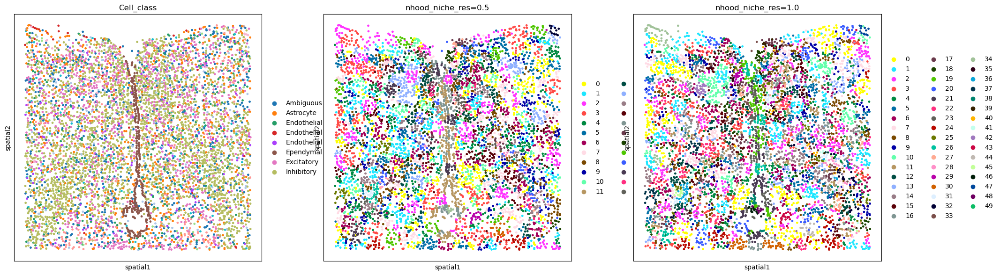

In [9]:
sq.pl.spatial_scatter(
    adata,
    color=["Cell_class", "nhood_niche_res=0.5", "nhood_niche_res=1.0"],
    shape=None,
    figsize=(7, 7),
)

This particular method allows us to use the `distance` and `n_hop_weights` parameters to control how we define the neighborhood. When `distance` is set to 1, the neighborhood is defined by the 1-hop neighbors. When `distance` is set to 2, the neighborhood is defined by the 2-hop neighbors, and so on. The `n_hop_weights` parameter is a list of weights for the different hop distances. When `n_hop_weights` is not provided, all hop distances are weighted equally.

In [10]:
sq.gr.calculate_niche(
    adata,
    groups="Cell_class",
    flavor="neighborhood",
    n_neighbors=10,
    resolutions=0.25,
    distance=3,
    n_hop_weights=[1, 0.7, 0.25],
)

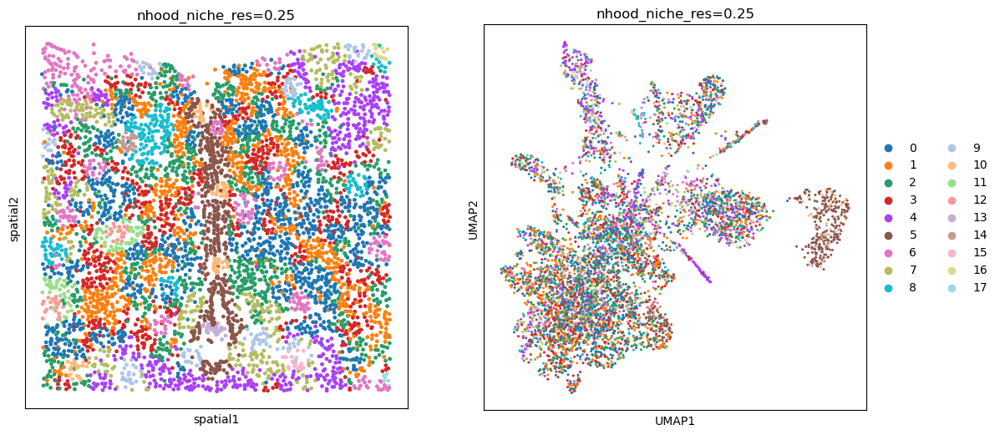

In [11]:
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(13, 6))

sq.pl.spatial_scatter(
    adata, color="nhood_niche_res=0.25", shape=None, ax=axs[0], legend_loc=None
)

sc.pl.umap(adata, color="nhood_niche_res=0.25", ax=axs[1])

## UATG
adapted from https://github.com/ElementoLab/utag/

Next we follow the UTAG approach, which doesn't require a previous annotation.

In [12]:
sq.gr.calculate_niche(adata, flavor="utag", n_neighbors=15, resolutions=[0.1, 0.5, 1.0])

In [13]:
adata.obs

,Cell_ID,Animal_ID,Animal_sex,Behavior,Bregma,Centroid_X,Centroid_Y,Cell_class,Neuron_cluster_ID,batch,nhood_niche_res=0.5,nhood_niche_res=1.0,nhood_niche_res=0.25,utag_niche_res=0.1,utag_niche_res=0.5,utag_niche_res=1.0
41437-4,8c7df84c-8a53-4aa4-86fd-26e575de9b0e,1,Female,Naive,-9.0,1313.511887,2162.459959,Microglia,nan,4,2,34,6,1,17,30
41438-4,3617ee7c-c0a8-4f18-b9bd-c7ca737ff665,1,Female,Naive,-9.0,1321.787911,2288.708578,Astrocyte,nan,4,2,1,6,1,17,30
41439-4,f0d0277a-cac1-4181-8528-abfd9a5403c0,1,Female,Naive,-9.0,1333.694106,2116.464893,Astrocyte,nan,4,2,34,6,1,17,30
41440-4,2dbbce4f-c54f-4df8-aced-590c971db48a,1,Female,Naive,-9.0,1339.956433,2200.067589,Astrocyte,nan,4,2,1,6,1,17,30
41441-4,74d3f69d-e8f2-4c33-a8ca-fac3eb65e55a,1,Female,Naive,-9.0,1340.563484,2251.463695,Endothelial 1,nan,4,2,1,6,1,17,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47617-4,7a0e3ee6-aa12-4ed8-80ae-465e186caa3f,1,Female,Naive,-9.0,3060.524623,3700.928535,Inhibitory,I-9,4,18,18,2,0,6,3
47618-4,6a2e534c-e94e-45d0-ae8b-a0459133d53b,1,Female,Naive,-9.0,3096.962169,3534.935314,Inhibitory,I-18,4,8,9,1,0,6,3
47619-4,0e5b91a1-43f1-4821-8d36-ec587850de66,1,Female,Naive,-9.0,2907.293885,3524.461287,Ambiguous,nan,4,14,12,3,0,1,3
47620-4,cc5fb740-cdd3-4456-999e-ad433c68d350,1,Female,Naive,-9.0,2908.555041,3568.968505,Ambiguous,nan,4,14,12,3,0,1,3


Visualize the results:

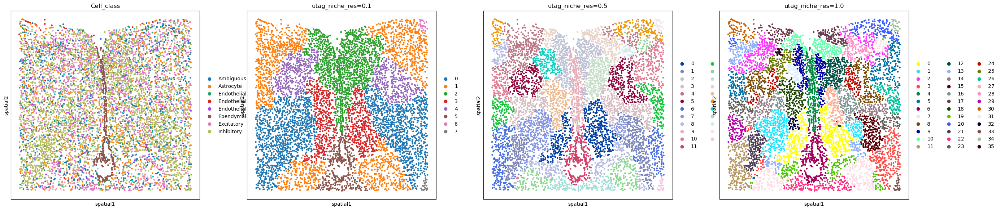

In [14]:
sq.pl.spatial_scatter(
    adata,
    color=["Cell_class", "utag_niche_res=0.1", "utag_niche_res=0.5", "utag_niche_res=1.0"],
    shape=None,
    figsize=(7, 7),
)

## Cellcharter
adapted from https://github.com/CSOgroup/cellcharter/

For the Cellcharter approach, multiple neighborhood based matrices are aggregated, dimensionality reduced, then clustered. The advantage of this method is, it doesn't require any annotation and we can decide the amount of niches we expect. 

Here we choose 5 clusters and aggregate 3 n-hop neighbor matrices.

In [15]:
sq.gr.calculate_niche(adata, flavor="cellcharter", n_components=10, distance=2)

In [16]:
adata.obs

,Cell_ID,Animal_ID,Animal_sex,Behavior,Bregma,Centroid_X,Centroid_Y,Cell_class,Neuron_cluster_ID,batch,nhood_niche_res=0.5,nhood_niche_res=1.0,nhood_niche_res=0.25,utag_niche_res=0.1,utag_niche_res=0.5,utag_niche_res=1.0,cellcharter_niche
41437-4,8c7df84c-8a53-4aa4-86fd-26e575de9b0e,1,Female,Naive,-9.0,1313.511887,2162.459959,Microglia,nan,4,2,34,6,1,17,30,5
41438-4,3617ee7c-c0a8-4f18-b9bd-c7ca737ff665,1,Female,Naive,-9.0,1321.787911,2288.708578,Astrocyte,nan,4,2,1,6,1,17,30,5
41439-4,f0d0277a-cac1-4181-8528-abfd9a5403c0,1,Female,Naive,-9.0,1333.694106,2116.464893,Astrocyte,nan,4,2,34,6,1,17,30,5
41440-4,2dbbce4f-c54f-4df8-aced-590c971db48a,1,Female,Naive,-9.0,1339.956433,2200.067589,Astrocyte,nan,4,2,1,6,1,17,30,5
41441-4,74d3f69d-e8f2-4c33-a8ca-fac3eb65e55a,1,Female,Naive,-9.0,1340.563484,2251.463695,Endothelial 1,nan,4,2,1,6,1,17,30,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47617-4,7a0e3ee6-aa12-4ed8-80ae-465e186caa3f,1,Female,Naive,-9.0,3060.524623,3700.928535,Inhibitory,I-9,4,18,18,2,0,6,3,4
47618-4,6a2e534c-e94e-45d0-ae8b-a0459133d53b,1,Female,Naive,-9.0,3096.962169,3534.935314,Inhibitory,I-18,4,8,9,1,0,6,3,6
47619-4,0e5b91a1-43f1-4821-8d36-ec587850de66,1,Female,Naive,-9.0,2907.293885,3524.461287,Ambiguous,nan,4,14,12,3,0,1,3,4
47620-4,cc5fb740-cdd3-4456-999e-ad433c68d350,1,Female,Naive,-9.0,2908.555041,3568.968505,Ambiguous,nan,4,14,12,3,0,1,3,2


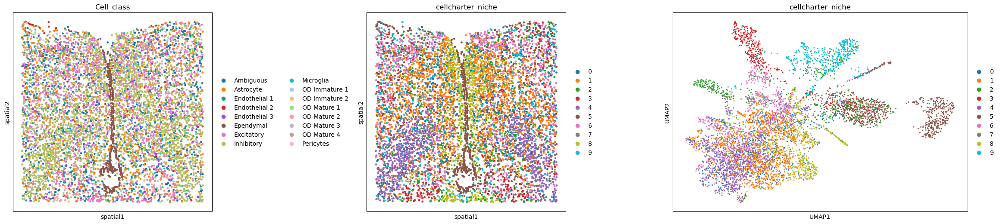

<Figure size 640x480 with 0 Axes>

In [17]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(30, 6))

sq.pl.spatial_scatter(adata, color="Cell_class", shape=None, ax=axs[0])

sq.pl.spatial_scatter(adata, color="cellcharter_niche", shape=None, ax=axs[1])

sc.pl.umap(adata, color="cellcharter_niche", ax=axs[2])

plt.tight_layout()

## Using `library_key`

### Prepare the data 

In [18]:
import pandas as pd


adata_all = sq.datasets.merfish()

# prettify column we'll use as library_key
adata_all.obs["Bregma"] = adata_all.obs["Bregma"].astype(int)
adata_all.obs["Bregma"] = pd.Categorical(adata_all.obs["Bregma"])

sq.gr.spatial_neighbors(adata_all, coord_type="generic", delaunay=False, n_neighs=20)

### Neighborhood approach

In [19]:
sq.gr.calculate_niche(
    adata_all,
    groups="Cell_class",
    flavor="neighborhood",
    library_key="Bregma",
    n_neighbors=20,
    resolutions=0.1,
)

INFO     Stratifying by library_key 'Bregma'                                                                       
INFO     Processing library '-28'                                                                                  
INFO     Processing library '-24'                                                                                  
INFO     Processing library '-19'                                                                                  
INFO     Processing library '-14'                                                                                  
INFO     Processing library '-9'                                                                                   
INFO     Processing library '-4'                                                                                   
INFO     Processing library '1'                                                                                    
INFO     Processing library '6'                                         

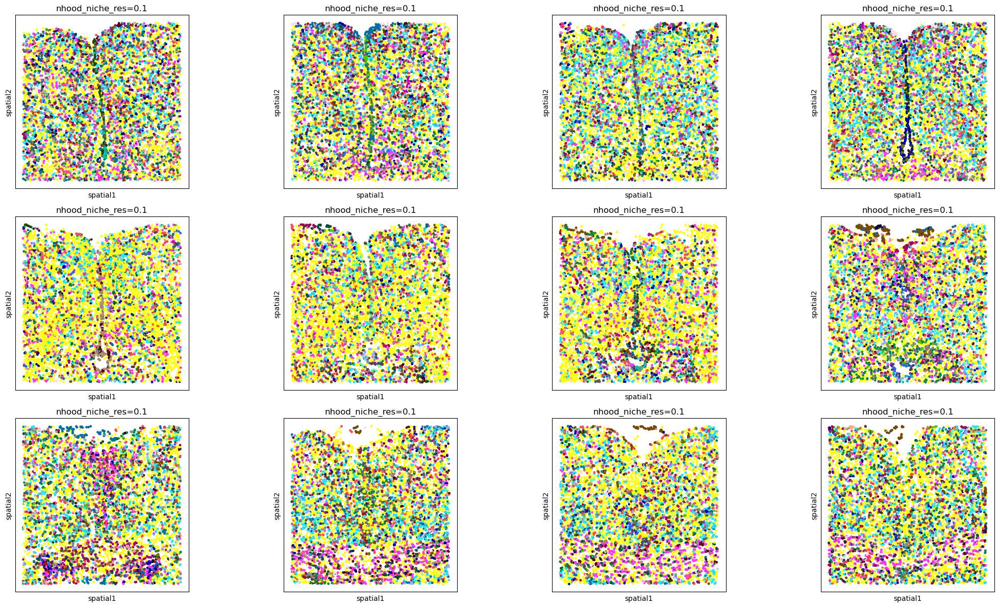

In [20]:
fig, axs = plt.subplots(ncols=4, nrows=3, figsize=(22, 12))
libraries = sorted(adata_all.obs["Bregma"].unique())

# like this instead of inside the spatial_scatter call due to the number of colors
for i, ax in enumerate(axs.flatten()):
    adata_subset = adata_all[adata_all.obs["Bregma"] == libraries[i]]
    sq.pl.spatial_scatter(adata_subset, color="nhood_niche_res=0.1", shape=None, legend_loc="None", ax=ax)

plt.tight_layout()

### UTAG

In [21]:
sq.gr.calculate_niche(adata_all, flavor="utag", library_key="Bregma", n_neighbors=15, resolutions=0.5)

INFO     Stratifying by library_key 'Bregma'                                                                       
INFO     Processing library '-28'                                                                                  
INFO     Processing library '-24'                                                                                  
INFO     Processing library '-19'                                                                                  
INFO     Processing library '-14'                                                                                  
INFO     Processing library '-9'                                                                                   
INFO     Processing library '-4'                                                                                   
INFO     Processing library '1'                                                                                    
INFO     Processing library '6'                                         

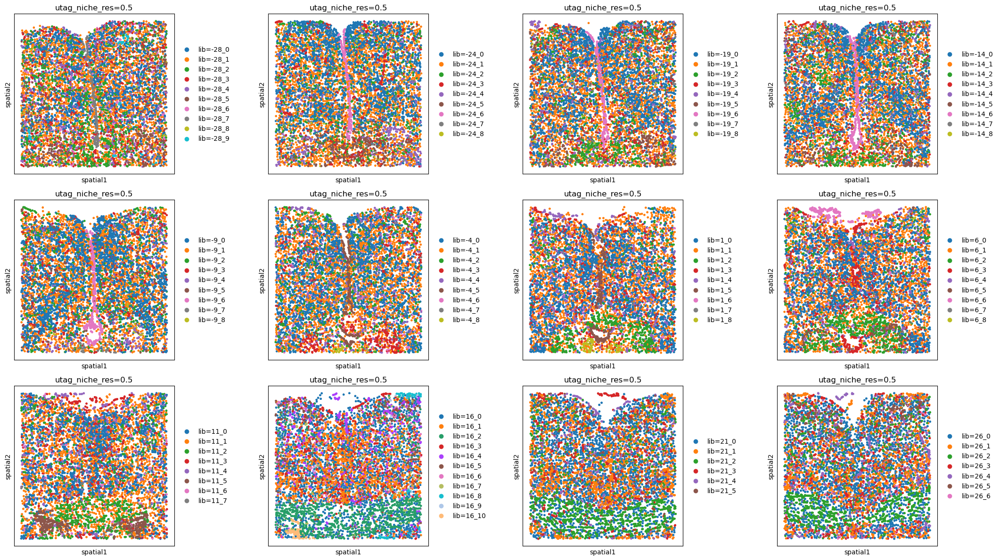

In [22]:
fig, axs = plt.subplots(ncols=4, nrows=3, figsize=(22, 12))
libraries = sorted(adata_all.obs["Bregma"].unique())

# like this instead of inside the spatial_scatter call due to the number of colors
for i, ax in enumerate(axs.flatten()):
    adata_subset = adata_all[adata_all.obs["Bregma"] == libraries[i]]
    sq.pl.spatial_scatter(
        adata_subset, color="utag_niche_res=0.5", shape=None, ax=ax
    )

plt.tight_layout()

### CellCharter

In [23]:
sq.gr.calculate_niche(
    adata_all, flavor="cellcharter", library_key="Bregma", n_components=10, distance=2
)

INFO     Stratifying by library_key 'Bregma'                                                                       
INFO     Processing library '-28'                                                                                  
INFO     Processing library '-24'                                                                                  
INFO     Processing library '-19'                                                                                  
INFO     Processing library '-14'                                                                                  
INFO     Processing library '-9'                                                                                   
INFO     Processing library '-4'                                                                                   
INFO     Processing library '1'                                                                                    
INFO     Processing library '6'                                         

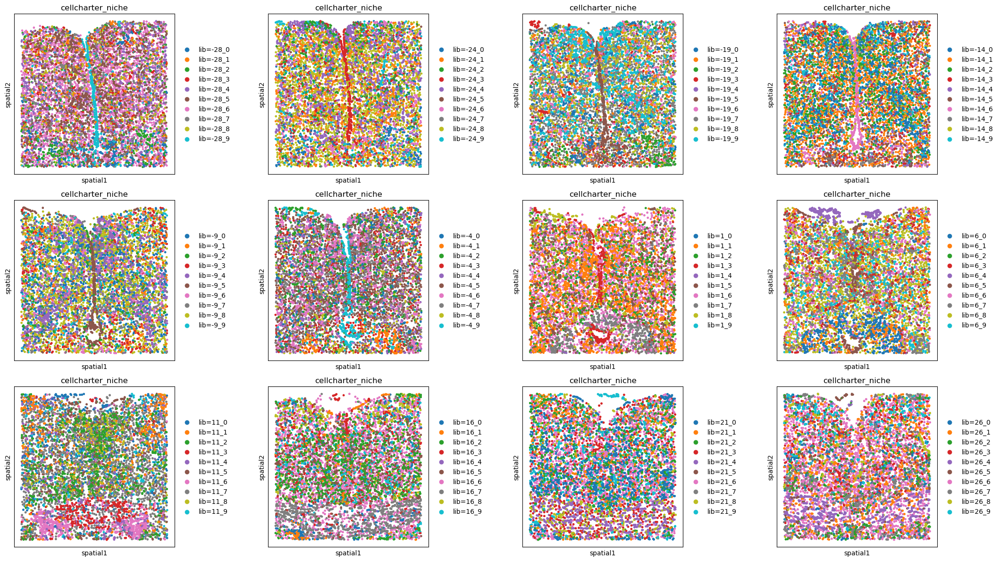

In [24]:
fig, axs = plt.subplots(ncols=4, nrows=3, figsize=(22, 12))
libraries = sorted(adata_all.obs["Bregma"].unique())

# like this instead of inside the spatial_scatter call due to the number of colors
for i, ax in enumerate(axs.flatten()):
    adata_subset = adata_all[adata_all.obs["Bregma"] == libraries[i]]
    sq.pl.spatial_scatter(adata_subset, color="cellcharter_niche", shape=None, ax=ax)

plt.tight_layout()